In [ ]:
# Clean up
# Run this cell in order to see your changes in your Drive
drive.flush_and_unmount()

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Grain Boundary Segmentation

In [2]:
# Imports

import tensorflow as tf
import scipy
import scipy.ndimage as ndi
import numpy as np
import skimage
from skimage import io, filters
from skimage import data, img_as_float, img_as_ubyte
import skimage.util.noise as noise
from skimage.restoration import denoise_bilateral
import matplotlib.pyplot as plt
import os
import math

import skimage
from skimage import img_as_ubyte
from skimage import exposure
from skimage import filters
from skimage import io
from skimage import color
from skimage import feature
from skimage import segmentation
from skimage import morphology
import scipy.ndimage as ndi
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from skimage.filters import sobel
from skimage.segmentation import felzenszwalb
from skimage.segmentation import mark_boundaries
from skimage.measure import label
from skimage.color import label2rgb

In [3]:
# Directory dictionary for referencing locations
## NOTE: This will need to be changed to your working directory in order to work properly

dir_map = {
    'IMAGES_DIR':'drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/',
    'WATERSHED_DIR':'drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Watershed/',
    'SLIC_DIR' :'drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/SLIC',
    'FELZ_DIR' : 'drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Felzenszwalb',
    'REDUCED_DIR':'drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Reduced/',
    'CHEMISTRY_DIR':'drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Chemistry/',
}

def create_directory(dir):
  if not os.path.exists(dir):
      os.makedirs(dir)
      print(f'Directory "{str(dir)}" created')
  else:
      print(f'Directory "{str(dir)}" already exists')

cwd = os.getcwd()
for _, path in dir_map.items():
    dir = cwd + '/' + path
    create_directory(dir)


Directory "/content/drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/" already exists
Directory "/content/drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Watershed/" already exists
Directory "/content/drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/SLIC" already exists
Directory "/content/drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Felzenszwalb" already exists
Directory "/content/drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Reduced/" already exists
Directory "/content/drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Chemistry/" already exists


# The Process

## Watershed Segmentation

(3272, 1883, 3)
(3272, 1883) uint8


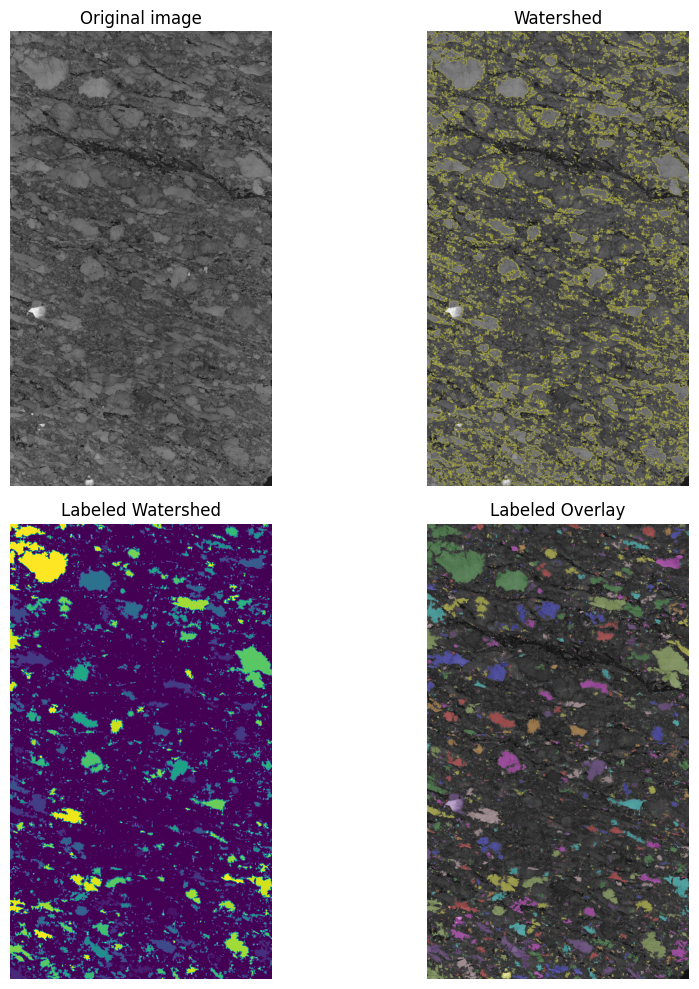

In [4]:

filename = dir_map['IMAGES_DIR'] + '/cropped_band_image.png'

grains = io.imread(filename)

# Remove the alpha channel
grains_cropped = grains[:,:,:3]
print(grains_cropped.shape)

# Convert the RGB to grayscale
gray_grains = (color.rgb2gray(grains_cropped)* 255).astype(np.uint8)
print(gray_grains.shape, gray_grains.dtype)

# Create an elevation map using Difference of Gaussians
elevation_map = skimage.filters.difference_of_gaussians(gray_grains, low_sigma=10)
markers = np.zeros_like(gray_grains)

# Create a mask
markers[gray_grains < 70] = 1
markers[gray_grains > 110] = 2

# Perform Watershed
watershed_grains = segmentation.watershed(elevation_map, markers)

# Morphology and label
watershed_grains = ndi.label(ndi.binary_fill_holes(watershed_grains - 1))[0]
labeled_grains = (skimage.measure.label(watershed_grains)* 255).astype(np.uint8)

# Overlay the labels onto the original image
labeled_overlay = (skimage.color.label2rgb(labeled_grains, image=grains_cropped, bg_label=0)* 255).astype(np.uint8)

# Plot the results
fig, ax_arr = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(10, 10))
ax1, ax2, ax3, ax4 = ax_arr.ravel()

ax1.imshow(grains_cropped)
ax1.set_title('Original image')

ax2.imshow(segmentation.mark_boundaries(gray_grains, watershed_grains))
ax2.set_title('Watershed')

ax3.imshow(labeled_grains)
ax3.set_title('Labeled Watershed')

ax4.imshow(labeled_overlay)
ax4.set_title('Labeled Overlay')

for ax in ax_arr.ravel():
    ax.set_axis_off()

plt.tight_layout()
plt.show()

## SLIC Segmentation

(3272, 1883, 3)


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


(3272, 1883, 3)


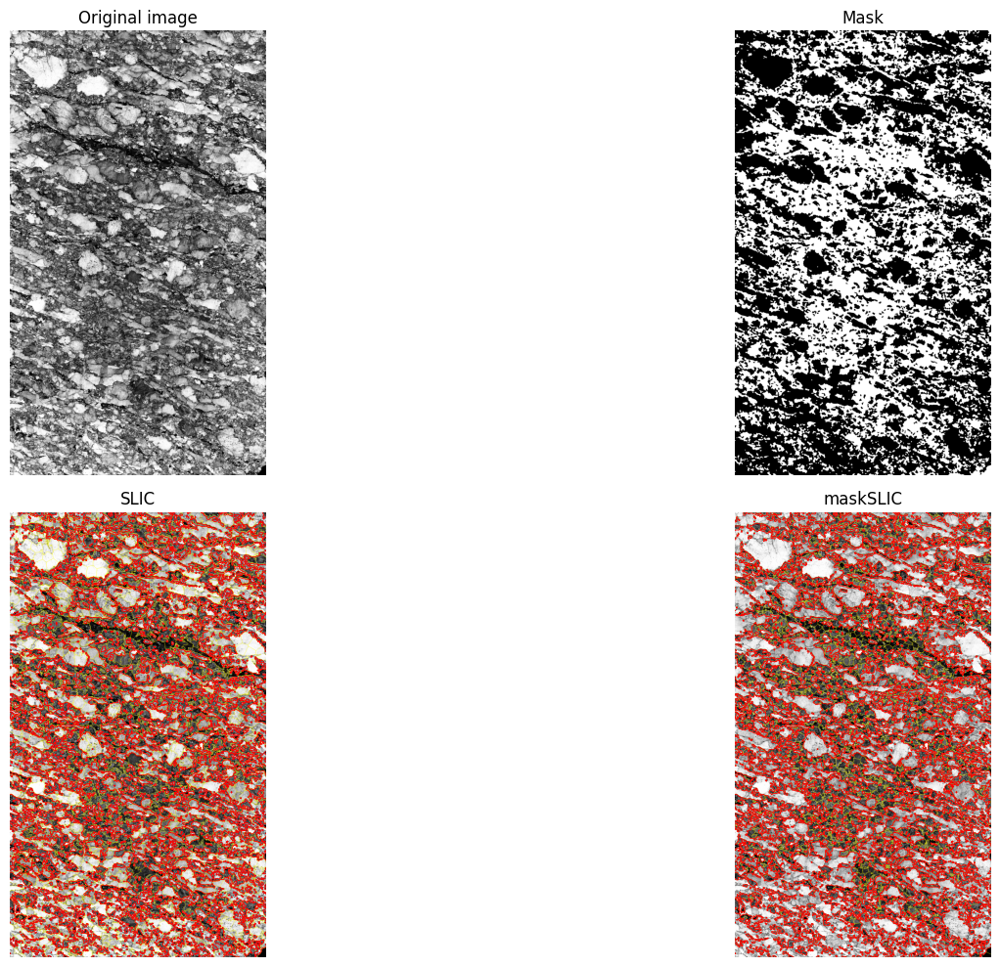

In [5]:
filename = dir_map['IMAGES_DIR'] + '/cropped_band_image.png'

grains = io.imread(filename)

# Remove the alpha channel
grains_cropped = grains[:,:,:3]
print(grains_cropped.shape)

# Equalize the histogram for enhanced contrast
grains_equalized = (skimage.exposure.equalize_hist(grains_cropped) * 255).astype(np.uint8)
print(grains_cropped.shape)

# Create a mask by first getting a grayscale image and performing morphology, and thresholding
lum = color.rgb2gray(grains_equalized)
mask = morphology.remove_small_holes(
    morphology.remove_small_objects(
        lum < 0.50))
mask = morphology.opening(mask, morphology.disk(3))

# SLIC result
slic = segmentation.slic(grains_equalized,  n_segments=2000, start_label=1, max_num_iter=50, sigma=2)

# maskSLIC result
m_slic = segmentation.slic(grains_equalized, n_segments=2000, mask=mask, start_label=1, max_num_iter=30, sigma=1)

# Display result
fig, ax_arr = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(20, 10))
ax1, ax2, ax3, ax4 = ax_arr.ravel()

ax1.imshow(grains_equalized)
ax1.set_title('Original image')

ax2.imshow(mask, cmap='gray')
ax2.set_title('Mask')

ax3.imshow(segmentation.mark_boundaries(grains_equalized, slic))
ax3.contour(mask, colors='red', linewidths=0.5)
ax3.set_title('SLIC')

ax4.imshow(segmentation.mark_boundaries(grains_equalized, m_slic))
ax4.contour(mask, colors='red', linewidths=0.5)
ax4.set_title('maskSLIC')

for ax in ax_arr.ravel():
    ax.set_axis_off()

plt.tight_layout()
plt.show()

  ## Felzenszwalb Segmentation


Felzenszwalb number of segments: 3584


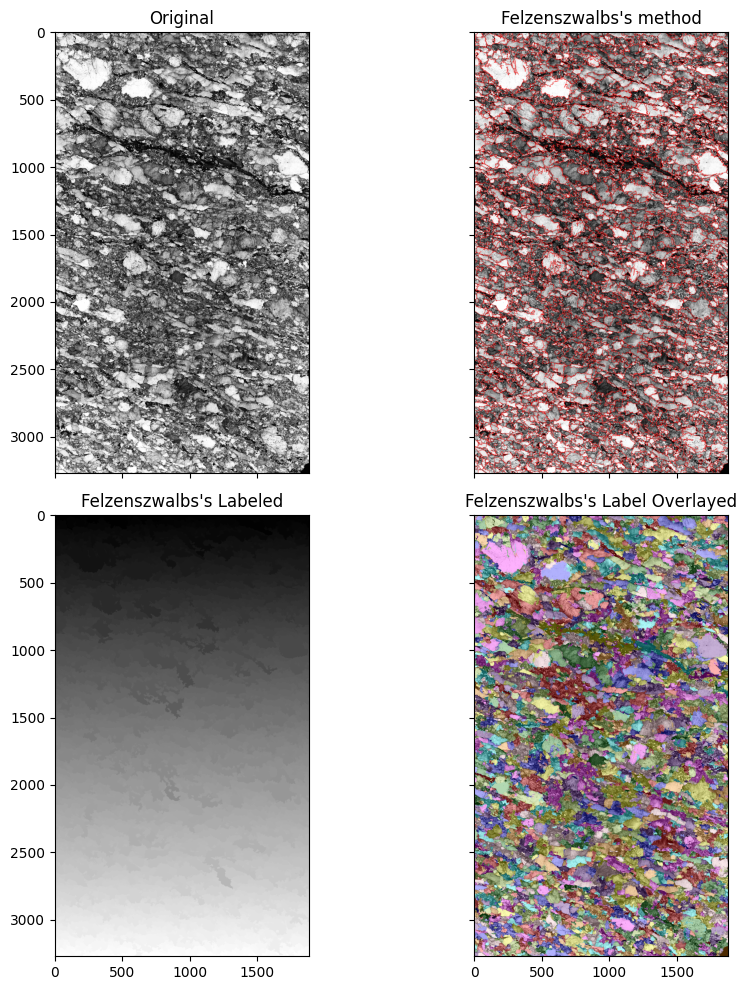

In [6]:
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage.measure import label
from skimage.color import label2rgb

filename = dir_map['IMAGES_DIR'] + '/cropped_band_image.png'

grains = io.imread(filename)

# Convert the image to float
grains = img_as_float(grains)

# Remove the alpha channel
grains_cropped = grains[:,:,:3]

# Convert the RGB to grayscale
grains_gray = color.rgb2gray(grains_cropped)

# Equalize the histogram for enhanced contrast
grains_equalized = (skimage.exposure.equalize_hist(grains_gray))

# Perform Felzenzwalbs
segments_fz = felzenszwalb(grains_equalized, scale=300, sigma=0.8, min_size=200)
print(f'Felzenszwalb number of segments: {len(np.unique(segments_fz))}')

# Plot the results
fig, ax = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)
ax1, ax2, ax3, ax4 = ax.ravel()
ax1.imshow(grains_equalized, cmap='gray')
ax1.set_title("Original")

ax2.imshow(mark_boundaries(grains_equalized, segments_fz, color=(1,0,0)))
ax2.set_title("Felzenszwalbs's method")

labeled = label(segments_fz)
ax3.imshow(labeled, cmap='gray')
ax3.set_title("Felzenszwalbs's Labeled")

image_label_overlay = label2rgb(labeled, image=grains_equalized)
ax4.imshow(image_label_overlay)
ax4.set_title("Felzenszwalbs's Label Overlayed")

plt.tight_layout()
plt.show()

# THE GOOD STUFF

## Felzenszwalb Segmentation and Chemistry Overlay

### Defining Functions

In [11]:
#######################################
#
#  Run this cell before proceeding
#
#######################################

import numpy as np
from skimage.color import gray2rgb, rgb2hsv, hsv2rgb
from skimage.measure import regionprops






# -----------------------
#   Helper functiions
# -----------------------






def clip_bounds(row: int, col: int, nrows: int, ncols: int):
  '''
    Validates and returns the row and column within the bounds of
    nrows and ncols
  '''

  if row < 0:
      row = 0
  elif row >= nrows:
      row = nrows - 1
  if col < 0:
      col = 0
  elif col >= ncols:
      col = ncols - 1
  return row, col






def get_rgb_value(color:str):

  '''
    Returns the rgb value of a color `color`
  '''
  colors = {
      'red':(1,0,0),
      'green':(0,1,0),
      'blue':(0,0,1),
      'yellow':(1,1,0),
      'white':(1,1,1),
      'black':(0,0,0),
      'purple': (150/255,10/255,217/255),
      'pink': (240/255,10/255,221/255)
      }
  assert(colors[color] is not None)
  return colors[color]






def preprocess(image:np.array):
  '''
    Prepares an image for segmentation. Returns a copy of the image.
  '''

  image = img_as_float(image)
  # In case of a binary image, convert to grayscale
  if len(image.shape) < 3:
    image = img_as_ubyte(image)
  else:
    # If the RGB image has an alpha channel, remove it
    if image.shape[2] > 3:
      image = image[:,:,:3]
    # Convert the RGB to grayscale
    image = color.rgb2gray(image)
  # Equalize the histogram
  return skimage.exposure.equalize_hist(image)






def get_felzenszwalb(image:np.array, scale:float=1.0, sigma:float=0.8, min_size:int=10):
  '''
      Performs Felzenszwalbs segmentation and returns the segmented mask
  '''
  return felzenszwalb(image, scale=scale, sigma=sigma, min_size=min_size)


def overlay(background:np.array, foreground:np.array, opacity:float):
  '''
    Overlays `foreground` with the given opacity ontop of `background`
  '''
  if (background.dtype == np.uint8 or background.dtype == np.uint64):
    background = (background/255).astype(np.float64)
  if (foreground.dtype == np.uint8 or foreground.dtype == np.uint64):
    foreground = (foreground/255).astype(np.float64)

  # Convert the images to HSV format
  img_hsv = rgb2hsv(background)
  mask_hsv = rgb2hsv(foreground)
  # Replace the hue and saturation of the original image with that of the mask
  img_hsv[..., 0] = mask_hsv[..., 0]
  img_hsv[..., 1] = mask_hsv[..., 1] * opacity
  # Convert back to rgb
  return hsv2rgb(img_hsv)






def label_mask(mask:np.array, overlay_image:np.array=None, uniform:bool=False,
               color:str='red', opacity:float=1.0):
  '''
      Generates the labeled image of `image`, overlays the labeled image it
      on top of `image`, and returns both the labeled and overlayed images
  '''

  labeled = label(mask)
  if uniform:
    labeled = make_labels_uniform(labeled)
  colorized = label2rgb(labeled, image=overlay_image)

  if uniform:
    color_mask = colorized.copy()
    color = list(get_rgb_value(color))
    for region in regionprops(labeled):
      for c in region.coords:
        color_mask[c[0],c[1]] = color
    colorized = overlay(colorized, color_mask, opacity)

  return labeled, colorized






def get_marked_boundaries(image:np.array, mask:np.array, color:str='red', background:bool=True):
  '''
    Marks the boundaries of `image` using the mask `mask`. If `background` is false,
    everything except the boundaries will be visable.
  '''
  if not background:
      image = np.zeros_like(image)
  return (mark_boundaries(image, mask, color=get_rgb_value(color), outline_color=None) * 255).astype(np.uint8)






def outline_boundaries(image:np.array, marked:np.array, color:str='black'):
  '''
      Returns a copy of `image` overlayed with `marked` boundaries colored `color`
  '''
  assert(image.shape == marked.shape)

  outlined = image.copy()
  color = list( get_rgb_value(color))
  for i in range(marked.shape[0]):
      for j in range(marked.shape[1]):
          if marked[i,j].any() > 0:
            outlined[i,j] = color
  return (outlined * 255).astype(np.uint8)






def make_labels_uniform(labels:np.array):
  '''
    Makes all labels a single value, notably 1.
  '''
  uniform = labels.copy()
  for i in range(uniform.shape[0]):
    for j in range(uniform.shape[1]):
      if uniform[i,j].any() > 0:
        uniform[i,j] = 1
  return uniform






def postprocess(background_image:np.array, overlay_image:np.array, mask:np.array, border_color:str):
  '''
    Removes labels in `overlay_image` that do not match those in `mask` and
    replaces any label borders.
  '''
  background_image = background_image.copy()

  # Mark borders and remove 'Ghost labels'
  border_color = list(get_rgb_value(border_color))
  for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
      if mask[i,j] != 0:
        # Check mask neighbors and mark the border of `background_image`, if needed.
        for r in range(-2,2,1):
          for c in range(-2,2,1):
            x,y = clip_bounds(i+r, j+c, mask.shape[0], mask.shape[1])
            if mask[x,y] == 0:
              background_image[x,y] = border_color
              background_image[i-x, j-c] = border_color
        else:
          background_image[i,j] = overlay_image[i,j]*255
  return background_image





# -----------------------
#   The Algorithms
# -----------------------





def segment_boundaries(image:np.array, scale:int=50, sigma:float=0.8, min_size:int=20,
                       outline_color:str='black', overlay:bool=True, overlay_image:np.array=None,
                       label:bool=True, label_uniform:bool=False, label_color:str='red',
                       label_opacity:float=1.0, batch_config:list=None):
  '''
      Given an input image, returns a copy of the image with its boundaries segmented and outlined.

      ---------------
      Parameters:
      ---------------
        image:
                A numpy array contain the RGB image data.
        scale:
                A number that controls the number and size of segments clusters (higher means
                larger clusters).
        sigma:
                Width (standard deviation) of the Gaussian kernel.
        min_size:
                Minimum component size.
        outline_color:
                A string decribing the color of the boundary outlines (ex: 'black').
        overlay:
                If enabled, the image (mask) produced will be overlayed with the provided image.
        overlay_image:
                If None, the `image` argument will be the image used. Otherwise, the image
                provided in this agrument will be used. NOTE: The image provided must be of the
                same shape as the input image.
        label_uniform:
                If enabled, all labels will be converted to a single label.
        label_color:
                The color of the resulting label. Omitted if `label_uniform` is not enabled.
        label_opactiy:
                The opacity of the label. Omitted if `label_uniform` is not enabled.
        batch_config:
                Accepts a configuration dictionary of arugments and properties to generate one or
                more separate images and a single background image.
                The configuration can have the following properties:

                in_images:        list[numpy.array],  --> A list of input images.
                scale:            uint,               --> An unsigned integer value
                sigma:            float,              --> A float between 0-1.0, inclusive
                min_size:         uint,               --> An unsigned integer value
                outline_color:    str,                --> A string describing the color
                label_uniform:    bool,               --> A boolean value
                overlay:          bool,               --> A boolean value
                overlay_image:    numpy.array[uint8], --> A numpy array of the image data
                label_color:     list[str],           --> A list of strings describing a color.
                                                          Note: len(label_color) == len(in_images)
                label_opacity:    float,              --> A float value between 0-1.0, inclusive
                update_callback:  void fn             --> An optional callback function that is
                                                          called after each iteration with
                                                          `batch_config` and the current index as
                                                          arguments in that order.

                Note: When `batch_config` is used, all other arguments are ignored. When using it
                is exected to set `image` to None.

      ---------------
      Returns:
      ---------------
        If batch mode is used, a list[numpy.array] of the resulting images are returned.
        Otherwise, a single numpy.array of the resulting image.

  '''

  # Define a local closure function that actually performs the alogrithm
  def __exec_segment_boundaries(image, scale, sigma, min_size, outline_color, overlay, overlay_image, label, label_uniform, label_color, label_opacity):
    background = None

    # Get the segmentation mask using Felzenszwalb
    mask = get_felzenszwalb(image, scale=scale, sigma=sigma, min_size=min_size)

    # Mark boundaries of the image using the mask
    marked = get_marked_boundaries(image, mask, background=False)
    if overlay:
      if overlay_image is not None:
        background = overlay_image
      else:
        background = image

    if label:
      # Get the labeled image overlayed with the mask
      _, overlay = label_mask(mask,
                              overlay_image=background,
                              uniform=label_uniform,
                              color=label_color,
                              opacity=label_opacity
                              )
    else:
      overlay=background

    # Return the segmented, labeled overlayed image with its boundaries outlined
    return outline_boundaries(overlay, marked, outline_color)


  # Run the alogrithm on a single image
  if batch_config is None:
    return __exec_segment_boundaries(image,
                                     scale,
                                     sigma,
                                     min_size,
                                     outline_color,
                                     overlay,
                                     overlay_image,
                                     label,
                                     label_uniform,
                                     label_color,
                                     label_opacity
                                     )

  # Destructure configurations
  in_images = batch_config['in_images']
  scale = batch_config['scale']
  sigma = batch_config['sigma']
  min_size = batch_config['min_size']
  outline_color = batch_config['outline_color']
  label = batch_config['label']
  label_uniform = batch_config['label_uniform']
  overlay=batch_config['overlay']
  overlay_image=batch_config['overlay_image']
  label_color=batch_config['label_color']
  opacity = batch_config['label_opacity'] if batch_config['label_opacity'] is not None else 1
  callback = batch_config['update_callback']

  results = []

  # Run the batch images
  for i, image in enumerate(in_images):
    image = preprocess(image)
    segmented = __exec_segment_boundaries(image,
                                          scale=scale,
                                          sigma=sigma,
                                          min_size=min_size,
                                          outline_color=outline_color,
                                          label=label,
                                          label_uniform=label_uniform,
                                          overlay=overlay,
                                          overlay_image=overlay_image,
                                          label_color=label_color[i],
                                          label_opacity=opacity
                                          )

    results.append(segmented)

    # Call the update callback, if given
    if callback is not None:
      callback(batch_config, i)

  return results





def segment_and_overlay_chemistry(band_contrast:np.array, chem_mask:np.array, opacity:float=1, label_color:str='yellow'):
  '''
    Segments the boundaries of an image `band_contrast` and its mask `chem_mask` and overlays
    the segmented `chem_mask` image onto `band_contrast` such that only the boundaries of
    `band_contrast` within the area of the of `chem_mask` labels are segmented and bordered.
  '''
  import concurrent.futures

  # Run the segmentation algorithms concurrently to reduce processing time
  with concurrent.futures.ThreadPoolExecutor(max_workers=2) as executor:

    # Segment the band contrast
    img_future = executor.submit(segment_boundaries,
                                                band_contrast,
                                                scale=200,
                                                sigma=0.55,
                                                min_size=300,
                                                outline_color='black',
                                                label=False
    )

    # Segment the mask
    mask_future = executor.submit(segment_boundaries,
                                                chem_mask,
                                                scale=30,
                                                sigma=0.1,
                                                min_size=10,
                                                outline_color='black',
                                                label_uniform=True,
                                                label_color=label_color,
                                                label_opacity=1
    )
    img_seg = img_future.result()
    mask_seg = mask_future.result()

  # Overlay the segmented mask onto the segmented band contrast
  overlay_seg = overlay(img_seg, mask_seg, opacity=opacity)

  # Clean up the result by removing invalid labels and replacing borders removed in `overlay`
  return postprocess(background_image=band_contrast, overlay_image=overlay_seg, mask=chem_mask, border_color='black').astype(np.uint8)



# How to use: segment_and_overlay_chemistry()

Processing...
Completed in 2.89 minutes
Saving results...
  - Saved "drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Chemistry/SI_segmented_band_contrast.png"
Finished


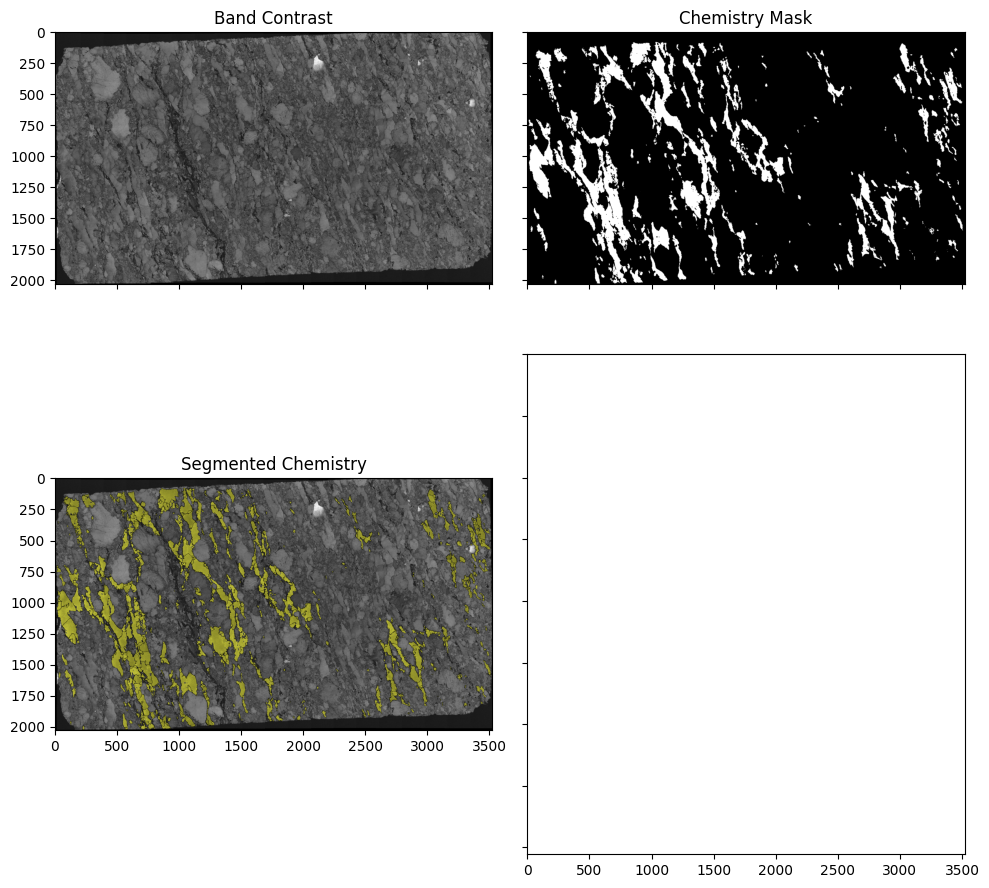

In [10]:
'''
  This example illustrates how to overlay a segmented chemistry label onto its
  band contrast image.
'''

import time

# The file for the band contrast image in which we will overlay the chemistry mask
band_filename = 'band_image.png'
band_image_file = dir_map['IMAGES_DIR'] + band_filename

# The chemistry mask image
in_si_filename = 'AND_Euler.png'
in_si_image_file = dir_map['REDUCED_DIR'] + in_si_filename

# The file name and filepath for our output image
out_si_filename = 'SI_segmented_band_contrast.png'
out_si_image_file = dir_map['CHEMISTRY_DIR'] + out_si_filename

# Open and load in the files
band_contrast_image = io.imread(band_image_file)
si_mask_image = io.imread(in_si_image_file)

print('Processing...')

# Timer will track the time taken process
start = time.time()

# Call the function with our images and arugments
chem_seg_image = segment_and_overlay_chemistry(
                                          band_contrast=band_contrast_image,
                                          chem_mask=si_mask_image,
                                          opacity=0.7,
                                          label_color='yellow',
                                          )

print(f'Completed in {((time.time() - start) / 60) :.2f} minutes')

print('Saving results...')

io.imsave(out_si_image_file, chem_seg_image)
print(f'  - Saved "{out_si_image_file}"')

print('Finished')

fig, ax = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)
ax1, ax2, ax3, ax4 = ax.ravel()

ax1.imshow(band_contrast_image)
ax1.set_title(f'Band Contrast')

ax2.imshow(si_mask_image, cmap='gray')
ax2.set_title(f'Chemistry Mask')

ax3.imshow(chem_seg_image)
ax3.set_title(f'Segmented Chemistry')

plt.tight_layout()
plt.show()

## How to use: segment_boundaries()

In [6]:
'''
  Responsible for the majority of the work inside `segment_and_overlay_chemistry()`,
  segment_boundaries can be used in two ways:

    1. single image mode
    2. batch images mode

  This example illustrates batch mode and provides an example for single mode
  as well.
'''

# The file for which we will overlay the chemistry mask onto
band_filename = 'band_image.png'
band_image_file = dir_map['IMAGES_DIR'] + band_filename


# All of the input filenames
in_filenames = [
  'AL_img.png',
  'K_img.png',
  'FE_img.png',
  'SI_img.png',
  'CA_img.png',
  'NA_img.png',
]


# All of the output filenames
out_filenames = [
  'band_overlay_AL.png',
  'band_overlay_K.png',
  'band_overlay_FE.png',
  'band_overlay_SI.png',
  'band_overlay_CA.png',
  'band_overlay_NA.png',
]


# The path to the input files
in_al_image_file = dir_map['REDUCED_DIR'] + in_filenames[0]
in_k_image_file = dir_map['REDUCED_DIR'] + in_filenames[1]
in_fe_image_file = dir_map['REDUCED_DIR'] + in_filenames[2]
in_si_image_file = dir_map['REDUCED_DIR'] + in_filenames[3]
in_ca_image_file = dir_map['REDUCED_DIR'] + in_filenames[4]
in_na_image_file = dir_map['REDUCED_DIR'] + in_filenames[5]


# The path to the output files
out_al_image_file = dir_map['CHEMISTRY_DIR'] + out_filenames[0]
out_k_image_file = dir_map['CHEMISTRY_DIR'] + out_filenames[1]
out_fe_image_file = dir_map['CHEMISTRY_DIR'] + out_filenames[2]
out_si_image_file = dir_map['CHEMISTRY_DIR'] + out_filenames[3]
out_ca_image_file = dir_map['CHEMISTRY_DIR'] + out_filenames[4]
out_na_image_file = dir_map['CHEMISTRY_DIR'] + out_filenames[5]


# Lists containing all of the input files and the label color of each respective mask
# Note that these must all be in order such that each input file has the same index as the output file
# and label color.
in_files = [
    in_al_image_file,
    in_k_image_file,
    in_fe_image_file,
    in_si_image_file,
    in_ca_image_file,
    in_na_image_file
]

in_images = []

# Open and store our images.
for i, file in enumerate(in_files):
  in_images.append(io.imread(file))

# List of colors of our label overlays
label_colors = [
    'red',
    'green',
    'blue',
    'yellow',
    'pink',
    'purple'
]

# Open the band contrast image that we will use as our image background
band_image = io.imread(band_image_file)

# Define an update callback that will will be called with these parameters after every iteration
def print_callback(batch_config, index):
    print(f'  - Proccessed "{in_files[index]}"')

# Create our configurations
segmentation_config = {
        'in_images':in_images,
        'scale':50,
        'sigma':0.1,
        'min_size':10,
        'outline_color':'black',
        'label': True,
        'label_uniform':True,
        'overlay':True,
        'overlay_image':band_image,
        'label_color':label_colors,
        'label_opacity':0.4,
        'update_callback': print_callback
        }

print('Processing...')

# Timer will track the time taken process
start = time.time()

# Finally, call the function and get the results
segmented = segment_boundaries(
    None,
    batch_config=segmentation_config
    )

# Uncomment below to run a single image.
#segmented = segment_boundaries(band_image, scale=50, sigma=0.1, min_size=10, outline_color='black',label_uniform=True, overlay=True, label_color='red', label_opacity=0.3)

print(f'Completed in {((time.time() - start) / 60) :.2f} minutes')

out_files = [
    out_al_image_file,
    out_k_image_file,
    out_fe_image_file,
    out_si_image_file,
    out_ca_image_file,
    out_na_image_file,
]

print('Saving results...')
# Save the images: Note the order is maintain from the input images
for i, image in enumerate(segmented):
    io.imsave(out_files[i], image)
    print(f'  - Saved "{out_files[i]}"')

print('Finished')


Processing...
  - Proccessed "drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Reduced/AL_img.png"
  - Proccessed "drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Reduced/K_img.png"
  - Proccessed "drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Reduced/FE_img.png"
  - Proccessed "drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Reduced/SI_img.png"
  - Proccessed "drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Reduced/CA_img.png"
  - Proccessed "drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Reduced/NA_img.png"
Completed in 10.93 minutes
Saving results...
  - Saved "drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Chemistry/band_overlay_AL.png"
  - Saved "drive/Shareddrives/Grain Detection Project Trello/Final Report/Segmentation/Images/Chemistry

### Plot The Results

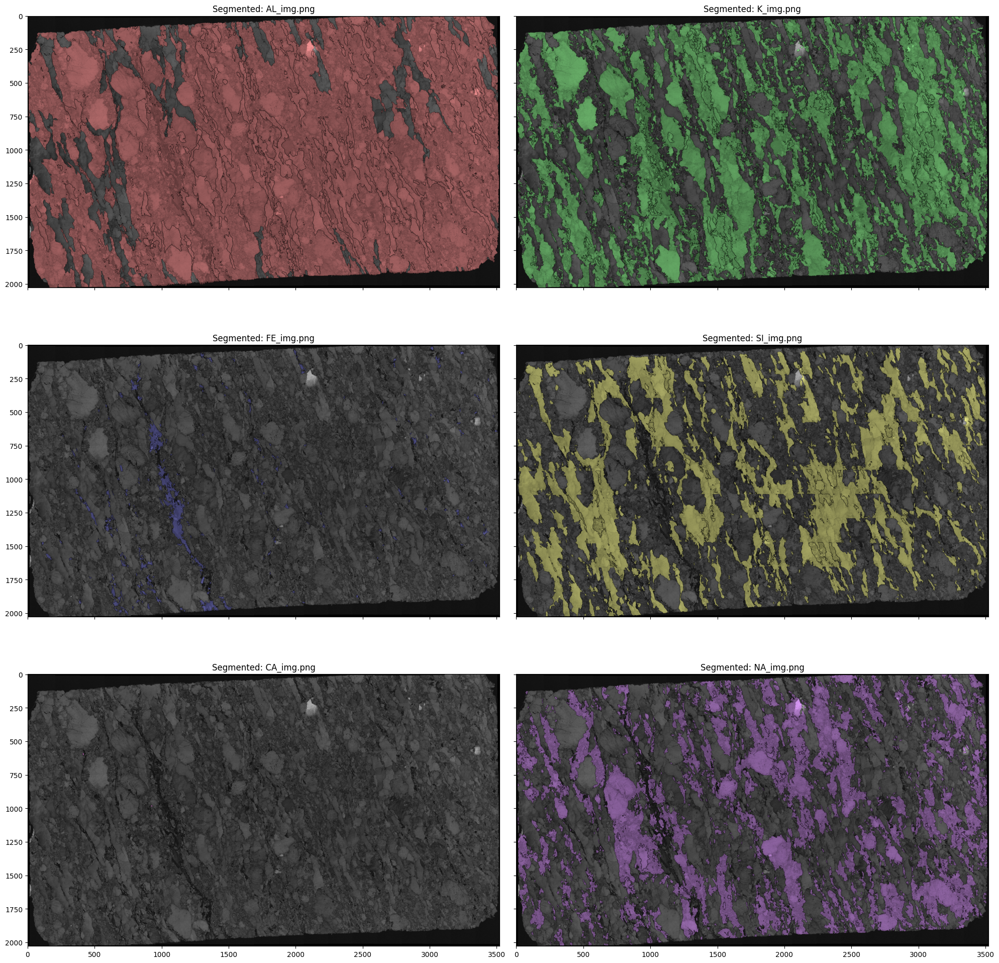

In [7]:
# Plot the resulting images

fig, ax = plt.subplots(3, 2, figsize=(20,20), sharex=True, sharey=True)
ax1, ax2, ax3, ax4, ax5, ax6 = ax.ravel()

ax1.imshow(segmented[0])
ax1.set_title(f'Segmented: {in_filenames[0]}')

ax2.imshow(segmented[1])
ax2.set_title(f'Segmented: {in_filenames[1]}')

ax3.imshow(segmented[2])
ax3.set_title(f'Segmented: {in_filenames[2]}')

ax4.imshow(segmented[3])
ax4.set_title(f'Segmented: {in_filenames[3]}')

ax5.imshow(segmented[4])
ax5.set_title(f'Segmented: {in_filenames[4]}')

ax6.imshow(segmented[5])
ax6.set_title(f'Segmented: {in_filenames[5]}')

plt.tight_layout()
plt.show()